# Test on different datasets
## Removed menpo
### evaluation of detector/landmars: ok but not perfect
    * MTCNN detector finds spurious signals
    * MTCNN detector fails at some obvious signals, bw photos and notably dark skin
    * HourGlass regressor has no conditioning for what is plausible causing errors:
    - on profiles
    - when part of face isnt clear, doesnt make a good symmetrical or structurally correct guess

In [1]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import os
import os.path as osp
from io import BytesIO
import requests

In [2]:
import tensorflow as tf
import numpy as np
from PIL import Image as Image
import matplotlib.pyplot as plt

import networks
import detect_face
from flags import FLAGS

np.set_printoptions(3)
slim = tf.contrib.slim
%matplotlib inline

## Init Networks
### MCTNN

In [3]:
minsize = 40 # minimum size of face
threshold = [ 0.6, 0.7, 0.7 ]  # three steps's threshold
factor = 0.709 # scale factor

with tf.Graph().as_default():
    sess = tf.Session()
    with sess.as_default():
        pnet, rnet, onet = detect_face.create_detector(sess, './detection')

./detection/cas3.npy True


### init DNFaceMultiview

In [4]:
def tf_heatmap_to_lms(heatmap):
    hs = tf.argmax(tf.reduce_max(heatmap, 2), 1)
    ws = tf.argmax(tf.reduce_max(heatmap, 1), 1)

    lms = tf.transpose(tf.to_float(tf.stack([hs, ws])), perm=[1, 2, 0])
    return lms


model_path = './ckpt/2D86/model.ckpt-217348'
# template = mio.import_pickle('./image/template.pkl.gz')

n_landmarks = 86
FLAGS.n_landmarks = 86

with tf.Graph().as_default() as g:
    images_input = tf.placeholder(tf.float32, shape=(None, None, None, 3), name='input_images')
    net_model = networks.DNFaceMultiView('')
    
    with tf.variable_scope('net'):
        lms_heatmap_prediction, states = net_model._build_network(images_input, datas=None, is_training=False, 
                                                                 n_channels=n_landmarks)
        pts_predictions = tf_heatmap_to_lms(lms_heatmap_prediction)
        variables_to_restore = slim.get_variables_to_restore()
        saver = tf.train.Saver(variables_to_restore)

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.Session(config=config,graph=g)

saver.restore(sess, model_path)

INFO:tensorflow:Restoring parameters from ./ckpt/2D86/model.ckpt-217348


### utils

In [5]:
def eval_and_show(img, show_crops=True):
    pim = Image.open(img)
    im = np.array(pim)
    
    ## DETECTion MTCNN
    bboxes, points = detect_face.detect_face(im.astype(np.float32), minsize,
                                                     pnet, rnet, onet, threshold, factor)
    
    print("%d faces detected"%len(bboxes))
    if len(bboxes) == 0:
        plt.imshow(im)
        return

    items = 2
    if show_crops and len(bboxes) == 1:
        items = 3

    width = 20
    height = width*pim.height/(items*pim.width)
    
    plt.figure(figsize=(width,height))
    _i = 1
    plt.subplot(1,items,_i);_i +=1
    plt.title("Face Detection MTCNN")
    show_MCTNN(im, bboxes, points)


    images, scales, origins = crops(pim, bboxes)
    # print("scales", scales)
    # print("origins", origins)
    
    # LANDMARK Regressuion
    images = images.astype(np.float64)/255
    print(images[0].dtype, images[0].min(), images[0].max(), images[0].shape)
    
    pts_pred = sess.run(pts_predictions,
            feed_dict={images_input: images})

    if items == 3:
    # print("images.shape", images.shape, images.min(), images.max() )
        plt.subplot(1,items,_i);_i +=1
        plt.title("landmarks over crop")
        plt.imshow(images[0])
        plt.scatter(pts_pred[0].T[1], pts_pred[0].T[0])

    # print(pts_pred.shape, type(pts_pred))
    # print(pts_pred[0,:5,:])
    
    plt.subplot(1,items,_i);_i +=1
    plt.title("landmarks")
    plt.imshow(im)
    for i, pts in enumerate(pts_pred):
        _pts = (pts*scales[i] + origins[i]).T
        plt.scatter(_pts[1], _pts[0])
    plt.show()
    
    if show_crops and len(bboxes) > 1:
        
        height = width/len(bboxes)
        plt.figure(figsize=(width,height))
        for i, image in enumerate(images):
            plt.subplot(1,len(bboxes), i+1)
            plt.imshow(image)
            plt.scatter(pts_pred[i].T[1], pts_pred[i].T[0])
        plt.show()

In [6]:
def show_MCTNN(img, bboxes, points):
    plt.imshow(img)
    for i, bbox in enumerate(bboxes):
        
        _box = bbox[:4][::-1].reshape(2,2)
        plt.scatter(_box.T[1], _box.T[0])
        
        w, h = (_box[0] - _box[1])
#         print(_box[0] - _box[1])
#         print("width", w, "height", h)
        p = plt.Rectangle(_box[1][::-1], h, w, fill=False,  color='g')
        plt.gca().add_patch(p)

        pts = points[:,i].reshape(2,5)
        plt.scatter(pts[0], pts[1])
        
        center = _box[1] + (_box[0] - _box[1])/2
        plt.scatter(*center[::-1])

        
def crops(pimg, bboxes, base=256):
    scales = []
    origins = []
    images = []
    for i, bbox in enumerate(bboxes):
        _box = bbox[:4][::-1].reshape(2,2)
        scale = np.linalg.norm(_box[0] - _box[1])
        center = _box[1] + (_box[0] - _box[1])/2
    
        cmin = (center - scale/2).astype(int)
        cmax =  (center + scale/2).astype(int)

        scales.append(scale/256)
        origins.append(cmin)
        #PIL.Image.BOX, PIL.Image.BILINEAR, PIL.Image.HAMMING, PIL.Image.BICUBIC or PIL.Image.LANCZOS
        images.append(np.array(pimg.crop((*cmin[::-1], *cmax[::-1])).resize(size=(256,256), resample=Image.LANCZOS)))

    return np.array(images), scales, origins


In [7]:
def loadimg(url, crop=None):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    if crop is not None:
        img = img.crop(crop)
    return img

def scrape(urls, store_folder, crops=None, ext=".jpg"):
    for i, url in enumerate(urls):
        crop = None if crops is None else crops[i]
        img = loadimg(url, crop)
        img.save(osp.join(store_folder, url.split("=")[-1]+ext))

## Test different datasets
### from the web

In [8]:
urls =['https://i.guim.co.uk/img/media/190ed2590083bf8e2826cd3c7a60ba93dbaebc2c/0_261_3000_1800/master/3000.jpg?width=1920&quality=85&auto=format&fit=max&s=5e0aa35033b6e86b8d611a2a8444f75a',
       'https://i.guim.co.uk/img/media/8c0be6c2e30e5bdf3ddde1fb2e7567b1d529c6e9/0_0_2000_3000/master/2000..jpg?width=1920&quality=85&auto=format&fit=max&s=725392d3eac55aba65c2c3d24c29c2b7']
ext = ".jpg"
folder = osp.abspath("image")

test_files = [osp.join(folder, url.split("=")[-1]+ext) for url in urls]
files = [f for f in os.listdir(folder) if osp.isfile(osp.join(folder, f))]
urls = [url for url in urls if url.split("=")[-1]+ext not in files]
scrape(urls, store_folder=folder, crops=None, ext=ext)


In [9]:
test_files

['/home/z/work/gits/Face/Face_Detection_Alignment/image/5e0aa35033b6e86b8d611a2a8444f75a.jpg',
 '/home/z/work/gits/Face/Face_Detection_Alignment/image/725392d3eac55aba65c2c3d24c29c2b7.jpg']

0 faces detected


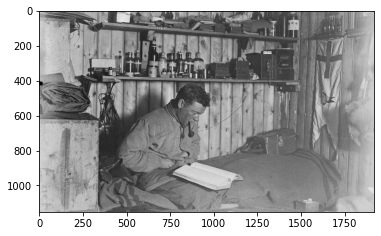

In [10]:
img = test_files[0]
eval_and_show(img)

Why did MCTNN not find what is clearly a face to any human? Simply it wasn't trained for this statistic. This demonstrates that no matter how good the training set is, the statistical approach fails. One could keep on piling data, or creating ever more complex networks that consider not just the statistics but also the context, and yet this approach will result in an infinitely narrow solution: there will always be a case where us humans see a face and MCTNN fails to find it.

1 faces detected
float64 0.0 0.6509803921568628 (256, 256, 3)


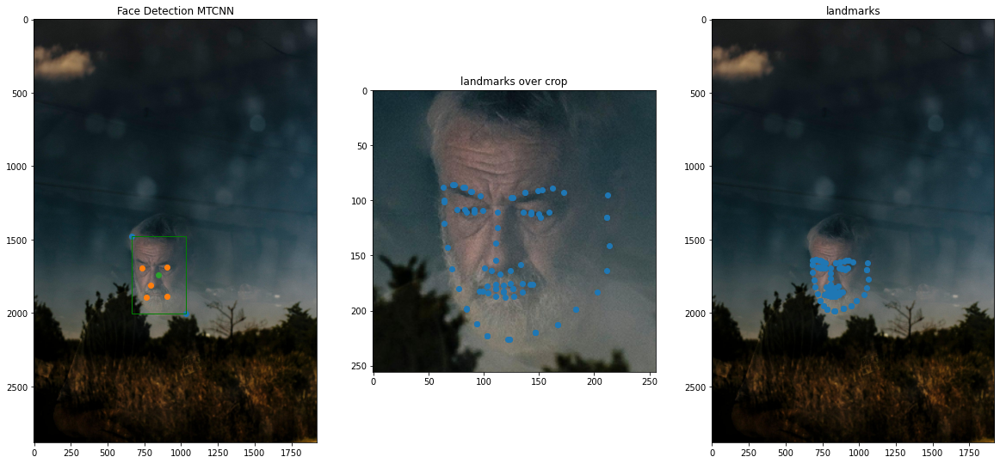

In [11]:
img = test_files[1]
eval_and_show(img)

In [12]:
imgs = ["Adience/faces/115111634@N07/coarse_tilt_aligned_face.1122.12109979636_a858e54030_o.jpg",
        "Adience/faces/62501130@N02/coarse_tilt_aligned_face.97.11399525103_515cbc4d6c_o.jpg",
        "CelebA/img_align_celeba/157776.jpg","CelebA/img_align_celeba/105312.jpg",
        "FacePoint/train/net_7876/_-40_2264_0.jpg","FacePoint/train/net_7876/_40_1330_0.jpg",
        "FacePoint/train/lfw_5590/Stacey_Yamaguchi_0001.jpg",
        "HELEN/images/2851040724_1.jpg",
        "HELEN/images/2864905534_1.jpg","HELEN/images/2807842663_1.jpg",
        "ICCV19_IBUG/iccv19-challenge-data/31/5b/315b0b3c44f7cea702f0247dc1a85bf3.jpg",
        "ICCV19_IBUG/iccv19-challenge-data/bd/f1/bdf1926c6fe685c6c401d42c1656b5a2.jpg",
        "LS3D-W/300VW-3D/CatB/412/0057.jpg","LS3D-W/300VW-3D/CatA/509/1017.jpg",
        "Mempo/helen/trainset/280469983_1.jpg","Mempo/muct/jpg/i256ta-mn.jpg",
        "MTFL/lfw_5590/Yann_Martel_0001.jpg",
        "Tiny/fg-fixed-context/S/29_Students_Schoolkids_Students_Schoolkids_29_374_obj3_ov0.5.png",
        "VGGFace2/images/n000006/0074_01.jpg","VGGFace2/images/n002454/0067_01.jpg",
        "VGGFace2/images/n000830/0017_02.jpg","LFW/berg/originalPics/2002/09/20/big/img_659.jpg",
        "LFW/lfw-deepfunneled/George_W_Bush/George_W_Bush_0352.jpg","LS3D-W-balanced-20-03-2017/1287.jpg",
        "LS3D-W-balanced-20-03-2017/33.jpg"]


1 faces detected
float64 0.0 1.0 (256, 256, 3)


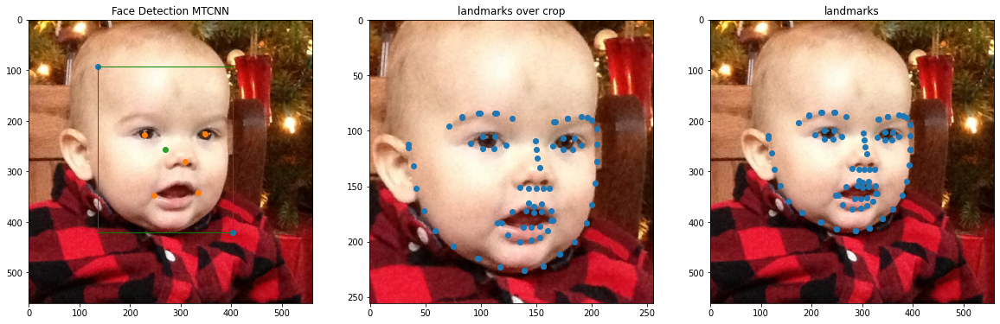


1 faces detected
float64 0.00784313725490196 1.0 (256, 256, 3)


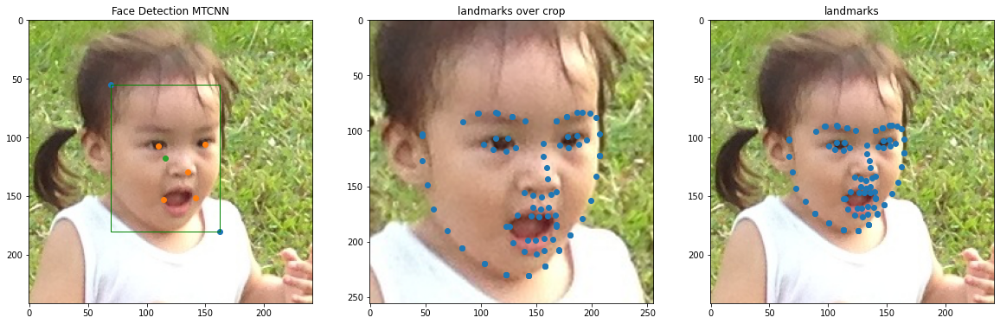


1 faces detected
float64 0.0 1.0 (256, 256, 3)


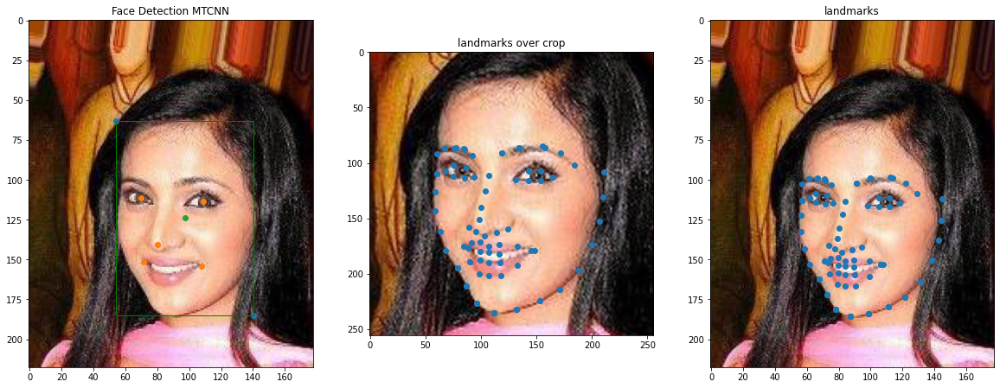


1 faces detected
float64 0.0 0.8823529411764706 (256, 256, 3)


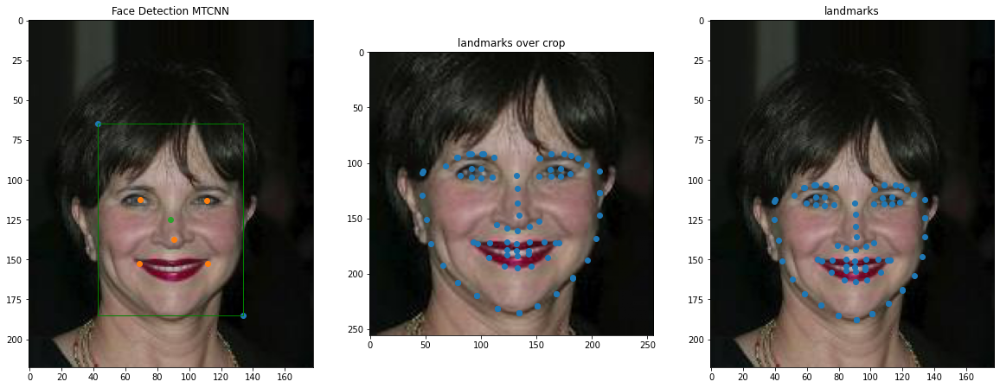


1 faces detected
float64 0.0 1.0 (256, 256, 3)


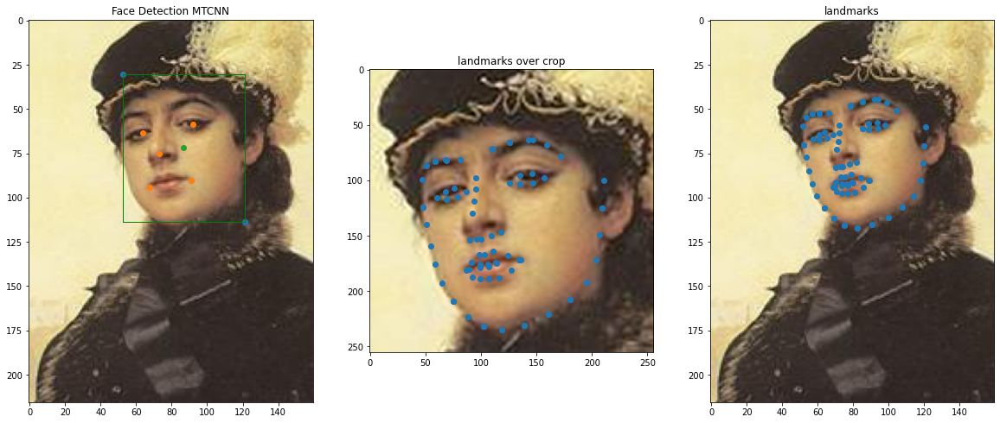


1 faces detected
float64 0.0 1.0 (256, 256, 3)


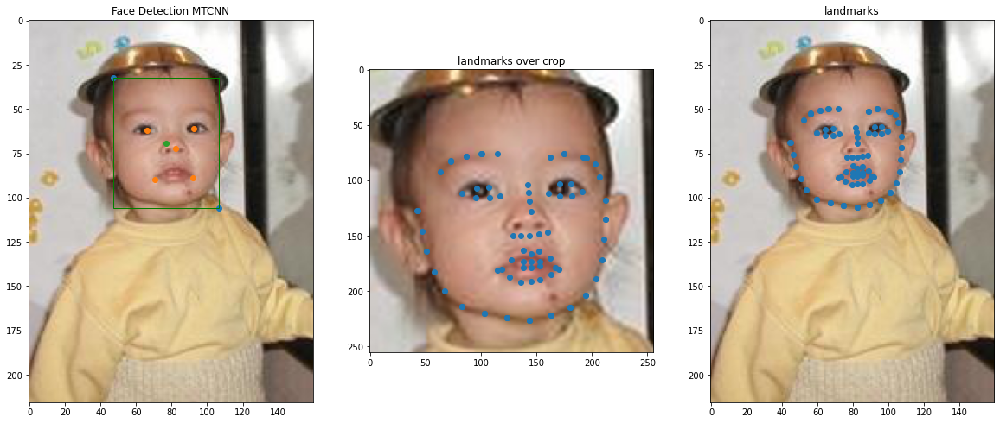


1 faces detected
float64 0.0 0.8901960784313725 (256, 256, 3)


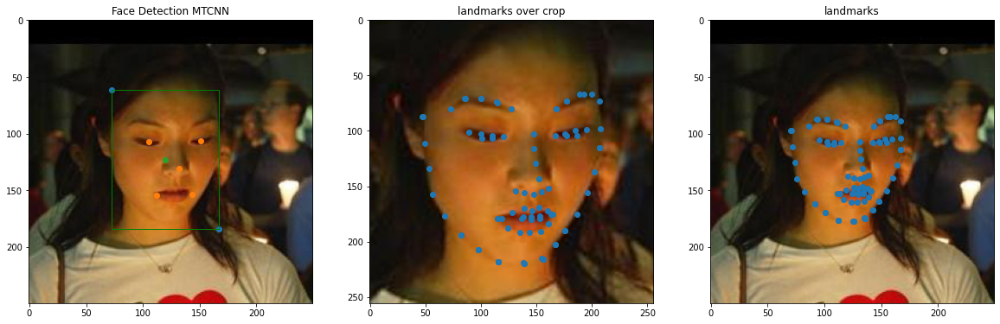


1 faces detected
float64 0.0 1.0 (256, 256, 3)


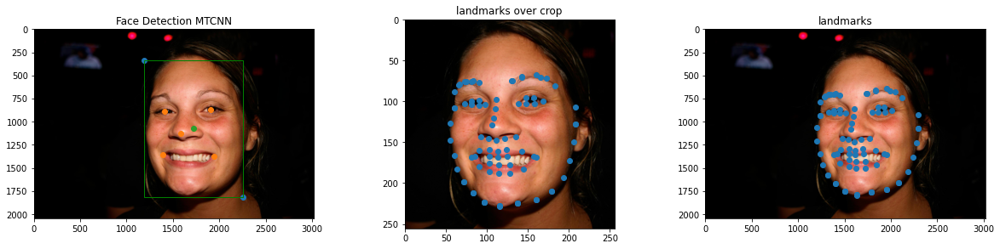


1 faces detected
float64 0.0 1.0 (256, 256, 3)


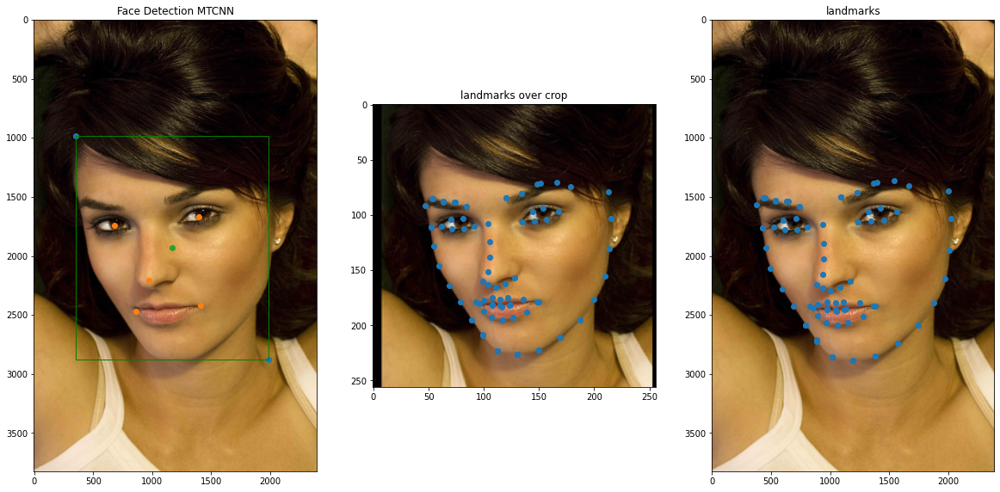


1 faces detected
float64 0.0 1.0 (256, 256, 3)


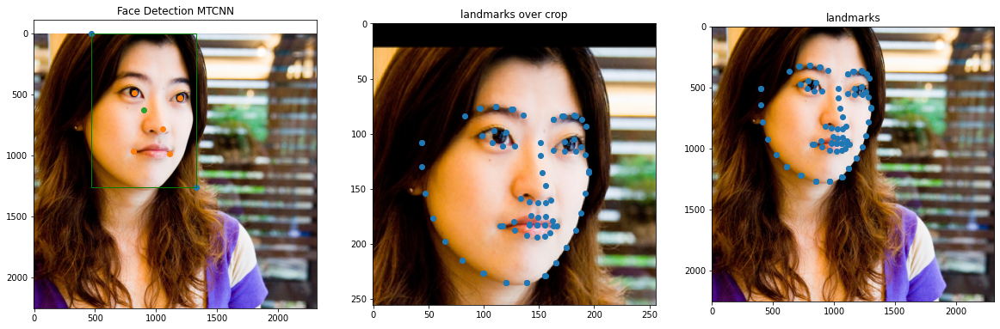


1 faces detected
float64 0.0 1.0 (256, 256, 3)


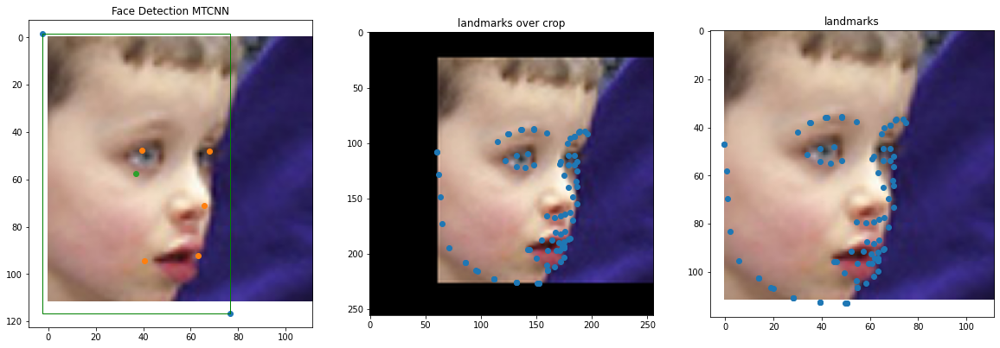


1 faces detected
float64 0.0 1.0 (256, 256, 3)


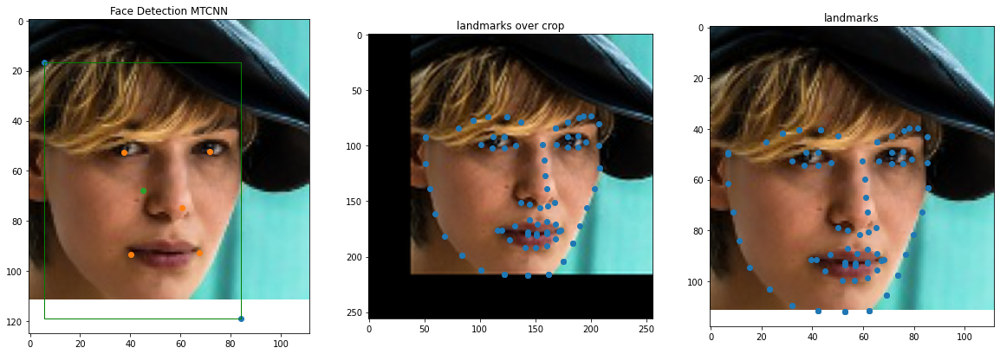


1 faces detected
float64 0.0 1.0 (256, 256, 3)


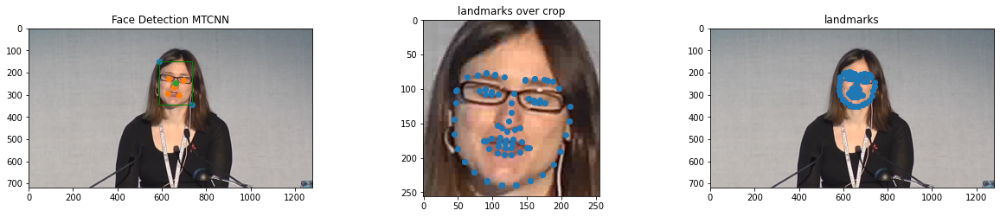


2 faces detected
float64 0.0 1.0 (256, 256, 3)


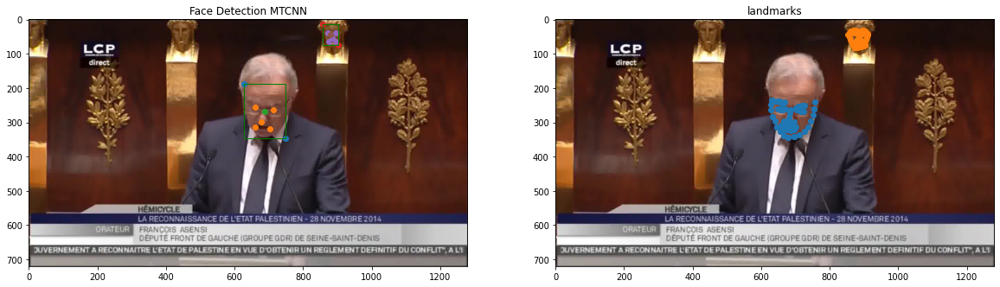

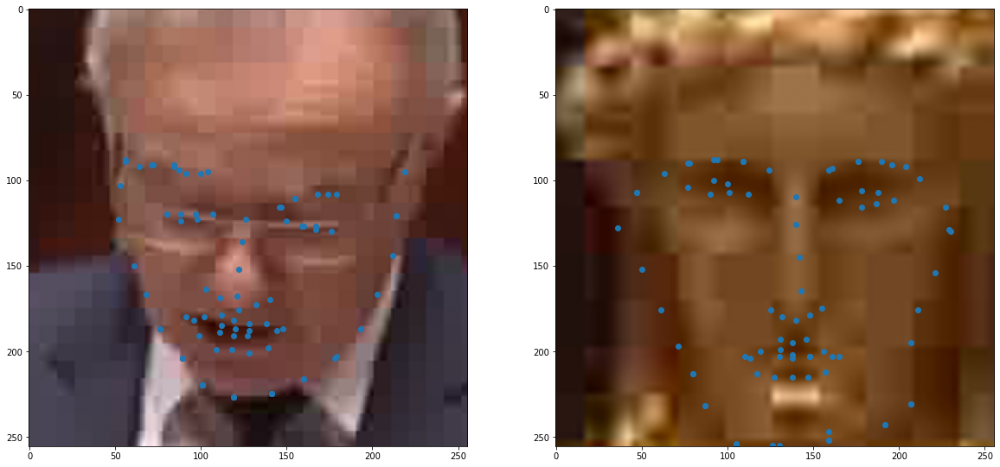


1 faces detected
float64 0.0 1.0 (256, 256, 3)


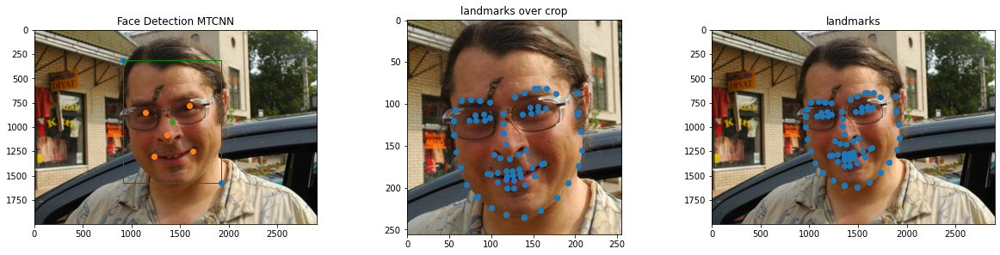


1 faces detected
float64 0.0 0.9137254901960784 (256, 256, 3)


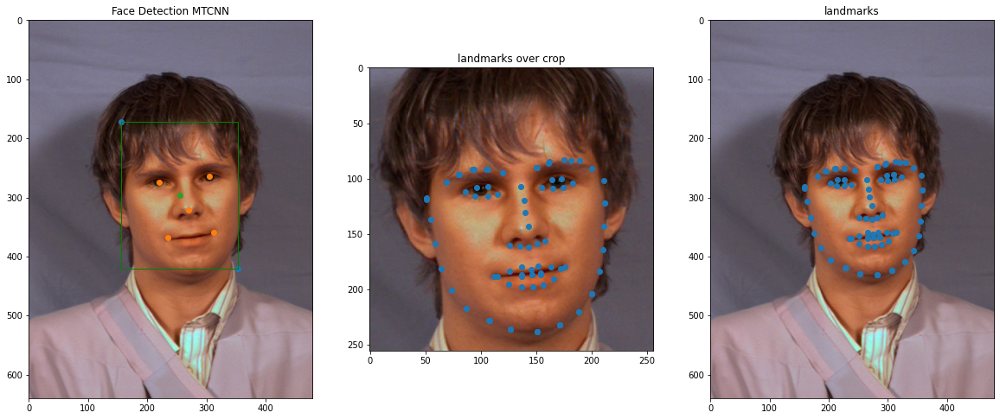


1 faces detected
float64 0.0 1.0 (256, 256, 3)


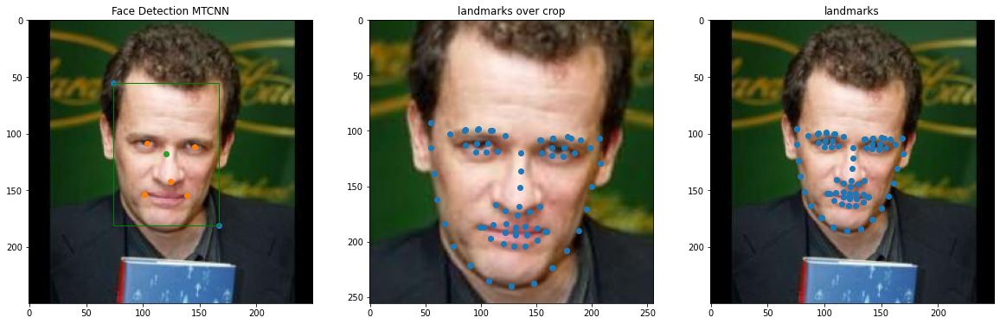


1 faces detected
float64 0.0 1.0 (256, 256, 3)


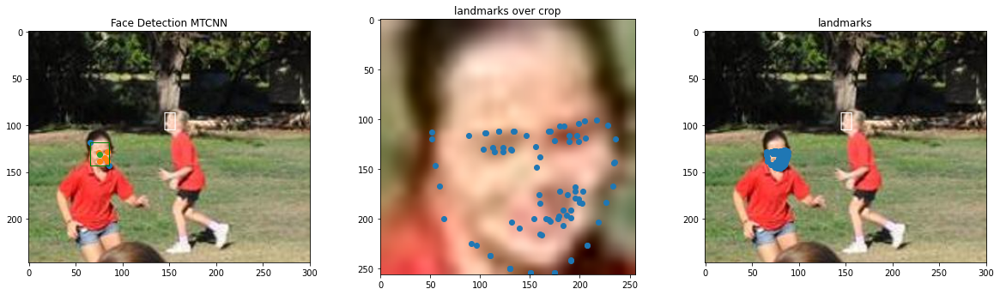


1 faces detected
float64 0.0 1.0 (256, 256, 3)


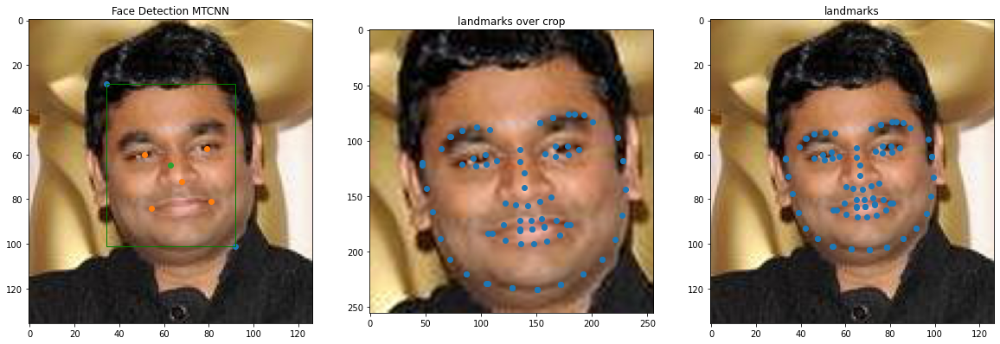


1 faces detected
float64 0.0 1.0 (256, 256, 3)


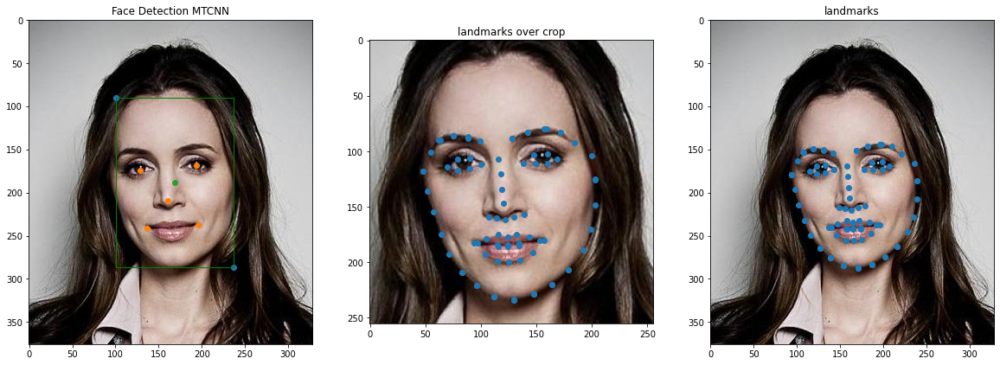


1 faces detected
float64 0.0 1.0 (256, 256, 3)


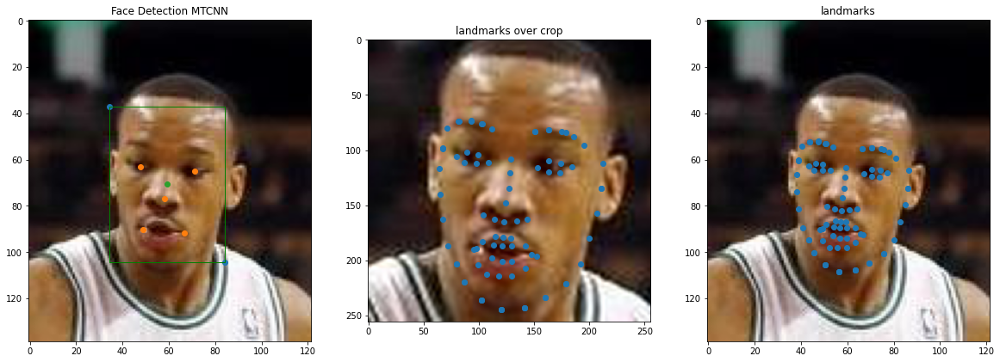


1 faces detected
float64 0.0 1.0 (256, 256, 3)


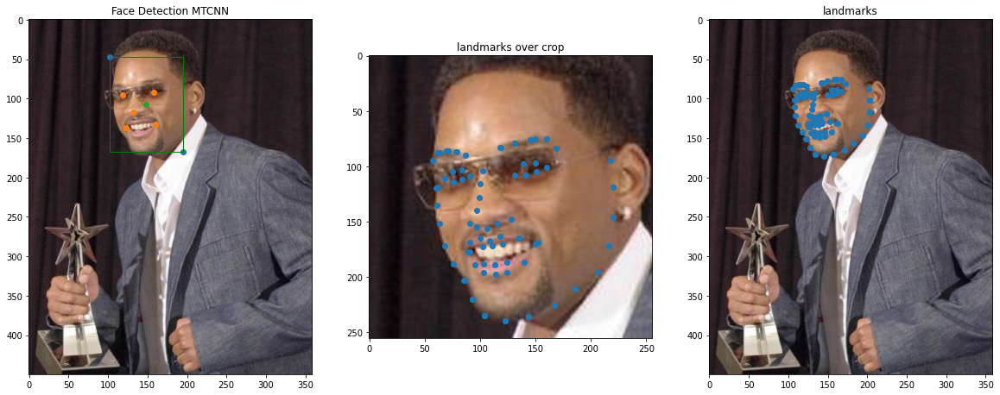


1 faces detected
float64 0.0 1.0 (256, 256, 3)


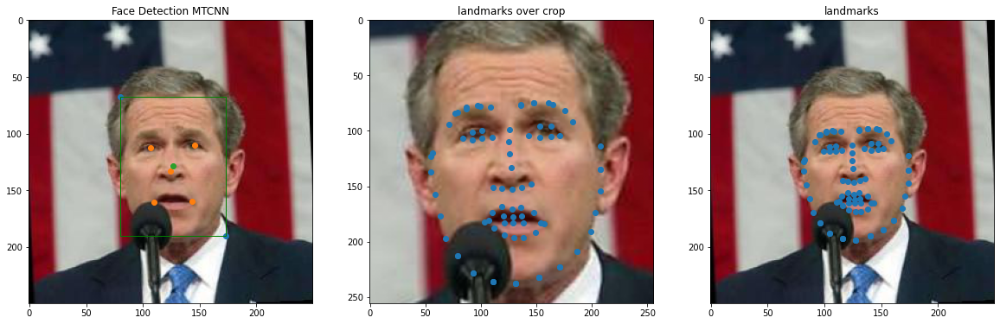


1 faces detected
float64 0.0 1.0 (256, 256, 3)


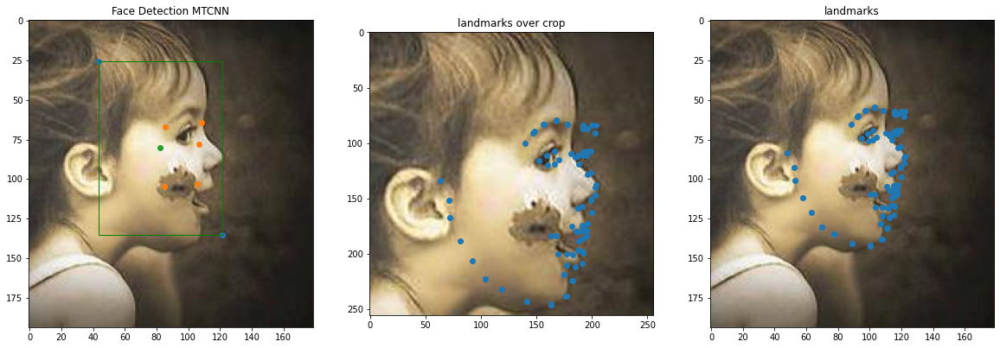


1 faces detected
float64 0.0 0.9764705882352941 (256, 256, 3)


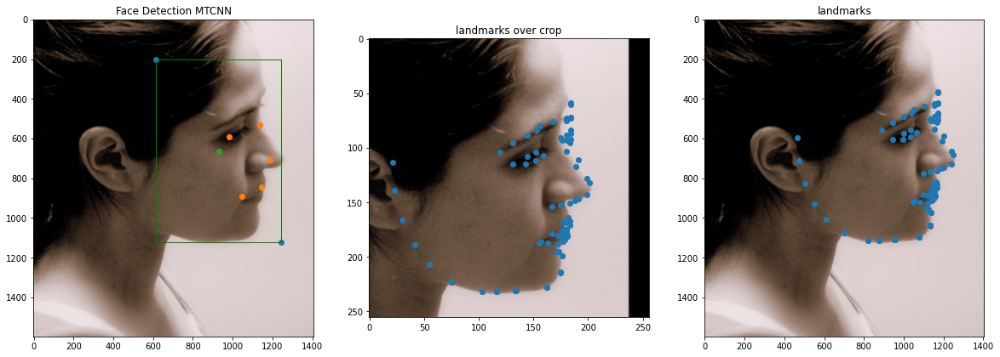

In [13]:
for img in imgs:
    img = osp.join(folder, img)
    print(img.split(osp.sep)[0])
    eval_and_show(img, show_crops=True)